## Lab 1

### Part 1

### Import Libraries

In [148]:
from bs4 import BeautifulSoup
import requests
import pandas as pd
import re
import random
from pandas.io.json import json_normalize
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import numpy as np
from sklearn.metrics import silhouette_score
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA    
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from sklearn.cluster import KMeans
import numpy as np

from random import randint
from time import sleep

### Scraping popvortex page to obtain a top 100 songs of all time

In [149]:
#attribute url
url = "https://www.popvortex.com/music/charts/top-100-songs.php"

In [150]:
#get request
response = requests.get(url)
response.status_code

200

In [151]:
soup = BeautifulSoup(response.content, "html.parser")

In [152]:
#divide the different criteria into a different lists to be put into our final dataframe

artist = []
song = []
genre = []
year = []

# define iterable
num_iter = len("body > div.container > div:nth-child(4) > div.col-xs-12.col-md-8 > div.chart-wrapper > div.feed-item")

songart = soup.select("body > div.container > div:nth-child(4) > div.col-xs-12.col-md-8 > div.chart-wrapper > div.feed-item")
genlist = soup.select("body > div.container > div:nth-child(4) > div.col-xs-12.col-md-8 > div.chart-wrapper > div.feed-item > div.chart-content")
yearlist = soup.select("body > div.container > div:nth-child(4) > div.col-xs-12.col-md-8 > div.chart-wrapper > div.feed-item > div.chart-content > ul > li:nth-child(2)")

# Append artist, song and year to their list
for i in range(num_iter):
    artist.append(songart[i].em.get_text())
    song.append(songart[i].cite.get_text())
    year.append(yearlist[i].get_text())    
    try:
        genre.append(genlist[i].ul.li.a.get_text())
    except:
        genre.append('Unknown')
        
#Attribute the lists to a dataframe

top100 = pd.DataFrame({'artist':artist
                    ,'track':song
                    ,'genre':genre
                    ,'year':year})
    

In [153]:
top100

,artist,track,genre,year
0,John Rich,Progress,New Release,Genre: Country
1,Jax,Victoria’s Secret,Pop,"Release Date: June 30, 2022"
2,Kate Bush,Running Up That Hill (A Deal with God),Pop,"Release Date: August 5, 1985"
3,Lizzo,About Damn Time,Pop,"Release Date: April 14, 2022"
4,Cole Swindell,She Had Me At Heads Carolina,Country,"Release Date: April 8, 2022"
...,...,...,...,...
95,twenty one pilots,Stressed Out,Alternative,"Release Date: April 28, 2015"
96,Puddle of Mudd,Blurry,Alternative,"Release Date: August 28, 2001"
97,Lamb of God,Omens,New Release,Genre: Heavy Metal
98,Luke Bryan,Country On,Country,"Release Date: June 30, 2022"


In [154]:
# In the year column we have a 'Genre:'; clean it
def genresplit(value):
    if 'Genre:' in value:
        name = value.split('Genre: ')[1]
        
        return name
    else:
        return value
    
top100['genre'] = top100['genre'].apply(genresplit)
top100['year'] = top100['year'].apply(genresplit)

# If genre is New Release, change it for the value of year
def tidy(value):

    type1 = value['genre']
    type2 = value['year']
    if str(type1) == 'New Release':
        return type2
    else:
        return type1

    
top100['genre'] = top100.apply(tidy,axis=1)

# Split the year column by the comma and find the year value. 
top100['year'] = top100['year'].str.split(", ", n = 1, expand = True)[1]

#"Nan" values filled with 2022, as it was originally a "New Release" value
top100['year'] = top100['year'].fillna(2022)
top100['track'] = top100['track'].str.strip()

In [155]:
top100

,artist,track,genre,year
0,John Rich,Progress,Country,2022
1,Jax,Victoria’s Secret,Pop,2022
2,Kate Bush,Running Up That Hill (A Deal with God),Pop,1985
3,Lizzo,About Damn Time,Pop,2022
4,Cole Swindell,She Had Me At Heads Carolina,Country,2022
...,...,...,...,...
95,twenty one pilots,Stressed Out,Alternative,2015
96,Puddle of Mudd,Blurry,Alternative,2001
97,Lamb of God,Omens,Heavy Metal,2022
98,Luke Bryan,Country On,Country,2022


### Part 2

### Scraping spinditty page to another top 100 songs of all time

In [156]:
urls = "https://spinditty.com/playlists/100songs"

In [157]:
responses = requests.get(urls)
responses.status_code

200

In [158]:
sopa = BeautifulSoup(responses.content, "html.parser")

In [159]:
# Attribute different values to song, artist, genre and year lists. 

songartist2 = []
genre2 = []
years2 = []
num_iter = len("body > div.container > div:nth-child(4) > div.col-xs-12.col-md-8 > div.chart-wrapper > div.feed-item")

songarts = sopa.select("body > phoenix-page > div > div > div.m-page > section > article > div > div > section > div > div > h2")
genres = sopa.select("body > phoenix-page > div > div > div.m-page > section > article > div > div > section > div > div > p")
years = sopa.select("body > phoenix-page > div > div > div.m-page > section > article > div > div > section > div > div > h3")
for i in range(len(songarts)):
    songartist2.append(songarts[i].get_text())

# Append artist, song and year to their list
for i in range(len(genres)):
    genre2.append(genres[i].get_text())
        
for i in range(len(years)):
    years2.append(years[i].get_text())

# Find genre in text. 
genrefin = []
for i in genre2:
    if 'Genre:' in i:
        genrefin.append(i)
    elif 'GENRE:' in i:
        genrefin.append(i)
        
# Filter any unneeded rows. 
songartfin = []        
for j in songartist2:
    if '#' in j:
        songartfin.append(j)
        
# Treat values longer than years
lap = []
for i in years2:
    if len(i) > 4:
        i = re.findall('\d{4}',i)
        lap.append(i)
    else:
        lap.append(i)
years2 = lap

# Drop any duplicates, then create the dataframe for table2
top100s = pd.DataFrame({'go':songartfin})
top100s = top100s.drop_duplicates().reset_index()
top100s = pd.DataFrame({'go': top100s['go'], 'genre':genrefin, 'year':years2})

In [160]:
top100s

,go,genre,year
0,"#100 - ""Bitter Sweet Symphony"" by The Verve",Genre: Britpop,[1997]
1,"#99: ""For What It's Worth"" by Buffalo Springfield",Genre: Folk Rock,1967
2,"#98 ""Fire and Rain"" by James Taylor",Genre: Folk Rock,[1970]
3,"#97: ""Rolling in the Deep"" by Adele",Genre: Pop,[2011]
4,"#96 ""(We're Gonna) Rock Around the Clock"" by B...",Genre: Rock & Roll,1954
...,...,...,...
95,"#5: ""Stairway to Heaven""",Genre: Rock,[1971]
96,"#4: ""Imagine"" by John Lennon",Genre: Rock,[1971]
97,"#3: ""Like a Rolling Stone"" by Bob Dylan",Genre: Folk Rock,[1965]
98,"#2: ""Yesterday"" by The Beatles",Genre: British Invasion,[1965]


In [161]:
# Determine artist, genre and track columns, as well as year cleaning. 


top100s['track'] = top100s['go'].str.split("by", n = 1, expand = True)[0]
top100s['track'] = top100s['track'].str.split('"', n = 1, expand = True)[1]
top100s['track'] = top100s['track'].str.replace('"','')

top100s['artist'] = top100s['go'].str.split("by", n = 1, expand = True)[1]

top100s['genre'] = top100s['genre'].str.split(': ', n = 1, expand = True)[1]

# If it's a list:
yearconvert = []
for i in top100s['year']:
    if isinstance(i,list):
        yearconvert.append(i[0])
    else:
        yearconvert.append(i)

top100s['year'] = yearconvert

top100s['track'] = top100s['track'].str.strip()

In [162]:
top100s = top100s[['track','artist','genre','year']]

In [163]:
top100s

,track,artist,genre,year
0,Bitter Sweet Symphony,The Verve,Britpop,1997
1,For What It's Worth,Buffalo Springfield,Folk Rock,1967
2,Fire and Rain,James Taylor,Folk Rock,1970
3,Rolling in the Deep,Adele,Pop,2011
4,(We're Gonna) Rock Around the Clock,Bill Haley and His Comets,Rock & Roll,1954
...,...,...,...,...
95,Stairway to Heaven,None,Rock,1971
96,Imagine,John Lennon,Rock,1971
97,Like a Rolling Stone,Bob Dylan,Folk Rock,1965
98,Yesterday,The Beatles,British Invasion,1965


In [164]:
#concatenate into one table
top100s = top100s[['track','artist','genre','year']]
top100 = top100[['track','artist','genre','year']]
top = pd.concat([top100,top100s], axis = 0).reset_index()
top = top.drop(columns='index')

In [165]:
top

,track,artist,genre,year
0,Progress,John Rich,Country,2022
1,Victoria’s Secret,Jax,Pop,2022
2,Running Up That Hill (A Deal with God),Kate Bush,Pop,1985
3,About Damn Time,Lizzo,Pop,2022
4,She Had Me At Heads Carolina,Cole Swindell,Country,2022
...,...,...,...,...
195,Stairway to Heaven,None,Rock,1971
196,Imagine,John Lennon,Rock,1971
197,Like a Rolling Stone,Bob Dylan,Folk Rock,1965
198,Yesterday,The Beatles,British Invasion,1965


In [166]:
top.to_csv('top.csv', index = False)

## Lab 2

In [167]:
def musicrecommender():
    song = input("Name of your song: ")    
    if song in list(top['track']):
        print(top['track'].iloc[random.randint(0,200)])    
    elif song not in list(top['track']):
        print("Sorry, we cannot recommend any songs")

In [168]:
musicrecommender()

Name of your song: Yesterday
Superstition


## Lab 3

### Extract a Dataframe using APIs of around 12.000 songs of various genders

Import the spotipy library and access account

In [169]:
secrets_file = open("secrets.txt","r")

In [170]:
string = secrets_file.read()
string.split('\n')

['cid:5009e6d50886402a9dc35685d01cb601',
 'csecret:22dcbee3fcf94f5c98fa0860ef941810']

In [171]:
secrets_dict={}
for line in string.split('\n'):
    if len(line) > 0:
        secrets_dict[line.split(':')[0]]=line.split(':')[1]

In [172]:
#InitializeSpotiPy with user credentials
sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id=secrets_dict['cid'],
                                                           client_secret=secrets_dict['csecret']))

In [173]:
def get_playlist_tracks(playlist_id):
    results = sp.user_playlist_tracks("spotify",playlist_id)
    tracks = results['items']
    while results['next']!=None:
        results = sp.next(results)
        tracks = tracks + results['items']
        sleep(randint(1,3))
    return tracks

In [174]:
playlist1 = get_playlist_tracks("6tIxyT1Gq6O7DK7rIEUEZo")
playlist2 = get_playlist_tracks("4pbDDX7np7Q1H0ghL7U9o7")

Here we see that the total songs (with duplicates, probably) is  

In [175]:
print('no. 1    ',len(playlist1))
print('no. 2    ',len(playlist2))
print('total is',len(playlist1)+len(playlist2))

no. 1     9999
no. 2     3878
total is 13877


Create a function to extract all necessary information from the dictionaries (and apply)

In [176]:
def artistsong(pops):
    artist = []
    song = []
    features = []
    counter = 0
    for i in pops:
        song.append(pops[counter]['track']['name'])
        artist.append(pops[counter]['track']['artists'][0]['name'])
        features.append(sp.audio_features(pops[counter]["track"]["uri"]))
        counter += 1
    return pd.DataFrame({'artist': artist, 'song': song, 'features': features})


In [177]:
%%time
playlist1df = artistsong(playlist1)

Expected id of type track but found type A%C3%AFcha spotify:local:Khaled:Sahra:A%C3%AFcha:259
Expected id of type track but found type Kids+In+America spotify:local:Kim+Wilde:Simply+The+Best+Of+The+80%27s:Kids+In+America:202
Expected id of type track but found type La+Bamba spotify:local:Los+Lobos:The+Best+Latino+Carnival+In+The+World+...+Ever%21+%28Disc+1%29:La+Bamba:171
Expected id of type track but found type Live+Is+Life spotify:local:Opus:Simply+The+Best+Of+The+80%27s:Live+Is+Life:244
Expected id of type track but found type All+Night+Long spotify:local:Lionel+Richie:Can%27t+Slow+Down:All+Night+Long:379
Expected id of type track but found type %28Keep+Feeling%29+Fascination spotify:local:The+Human+League:Grand+Theft+Auto%3A+Vice+City%2C+Vol.+2%3A+Wave+103:%28Keep+Feeling%29+Fascination:222
Expected id of type track but found type More+Than+This spotify:local:Roxy+Music:Grand+Theft+Auto%3A+Vice+City%2C+Vol.+3%3A+Emotion+98.3:More+Than+This:266
Expected id of type track but found ty

CPU times: total: 1min 5s
Wall time: 14min 8s


In [178]:
%%time
playlist2df = artistsong(playlist2)

CPU times: total: 25.5 s
Wall time: 5min 21s


Our dataframes look like this. The only problem is that the upis are not unpacked yet. We will deal with that now

In [179]:
playlist1df

,artist,song,features
0,Queen,A Kind Of Magic - Remastered 2011,"[{'danceability': 0.67, 'energy': 0.776, 'key'..."
1,Queen,Bohemian Rhapsody - Remastered 2011,"[{'danceability': 0.414, 'energy': 0.404, 'key..."
2,Queen,Another One Bites The Dust - Remastered 2011,"[{'danceability': 0.933, 'energy': 0.528, 'key..."
3,Queen,Don't Stop Me Now - Remastered 2011,"[{'danceability': 0.559, 'energy': 0.868, 'key..."
4,Queen,Under Pressure - Remastered 2011,"[{'danceability': 0.671, 'energy': 0.712, 'key..."
...,...,...,...
9994,Kip Winger,California - From the Moon to the Sun,"[{'danceability': 0.517, 'energy': 0.444, 'key..."
9995,Kip Winger,What We Are - From the Moon to the Sun,"[{'danceability': 0.476, 'energy': 0.721, 'key..."
9996,Kip Winger,One Big Game - From the Moon to the Sun,"[{'danceability': 0.542, 'energy': 0.7, 'key':..."
9997,Kip Winger,Why - From the Moon to the Sun,"[{'danceability': 0.27, 'energy': 0.561, 'key'..."


In [180]:
playlist2df

,artist,song,features
0,ANGRA,Live and Learn,"[{'danceability': 0.431, 'energy': 0.984, 'key..."
1,ANGRA,Bleeding Heart,"[{'danceability': 0.5, 'energy': 0.545, 'key':..."
2,ANGRA,Hunters and Prey,"[{'danceability': 0.56, 'energy': 0.892, 'key'..."
3,ANGRA,Eyes of Christ,"[{'danceability': 0.512, 'energy': 0.937, 'key..."
4,ANGRA,Rebirth (Acoustic Version),"[{'danceability': 0.348, 'energy': 0.596, 'key..."
...,...,...,...
3873,Fleetwood Mac,Family Man,"[{'danceability': 0.688, 'energy': 0.644, 'key..."
3874,Fleetwood Mac,Welcome To The Room...Sara,"[{'danceability': 0.632, 'energy': 0.555, 'key..."
3875,Fleetwood Mac,Isn't It Midnight,"[{'danceability': 0.469, 'energy': 0.73, 'key'..."
3876,Fleetwood Mac,When I See You Again,"[{'danceability': 0.544, 'energy': 0.0907, 'ke..."


In [181]:
# Flattening using json_normalize() creates a dataframe out of the dictionaries inside of the columns 

playlist1df['features'] = json_normalize(playlist1df['features'])
playlist2df['features'] = json_normalize(playlist2df['features'])

# Convert structured or record ndarray to DataFrame

playlist1features = pd.DataFrame.from_records(playlist1df.features.dropna().tolist())
playlist2features = pd.DataFrame.from_records(playlist2df.features.dropna().tolist())

### We concat these dataframes
# for playlist1
playlist1df = playlist1df.reset_index(drop = True)
playlist1features = playlist1features.reset_index(drop = True)
playlist_db1 = pd.concat([playlist1df,playlist1features], axis = 1)

# for playlist2
playlist2df = playlist2df.reset_index(drop = True)
playlist2features = playlist2features.reset_index(drop = True)
playlist_db2 = pd.concat([playlist2df,playlist2features], axis = 1)

# Drop our features column (it has now been unpacked)
playlist_db1 = playlist_db1.drop(columns = 'features')
playlist_db2 = playlist_db2.drop(columns = 'features')


C:\Users\Jose María\AppData\Local\Temp\ipykernel_11844\670056048.py:3: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead.
  playlist1df['features'] = json_normalize(playlist1df['features'])
C:\Users\Jose María\AppData\Local\Temp\ipykernel_11844\670056048.py:4: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead.
  playlist2df['features'] = json_normalize(playlist2df['features'])


In [182]:
final_p.to_csv('song_recommender_playlist.csv', index = False)

## Lab 4

**Drop columns and NaN values** There were only 12 lines with NaN values (those mentioned in cell 36's warning when importing the first playlist)

In [184]:
#drop type column, track_href, key, id, uri, duration_ms, mode, time_signature and analysis url. They have a negative impact on the precision of the model.  
final_p = pd.read_csv('song_recommender_playlist.csv')
final_p = final_p.drop(columns= ["type","track_href","analysis_url", 'key', 'id', 'uri', 'duration_ms','mode', 'time_signature'], axis=1)
# drop nan values
final_p = final_p.dropna(subset = ['danceability', 'artist'])
final_p

KeyError: "['type', 'track_href', 'analysis_url', 'key', 'id', 'uri', 'duration_ms', 'mode', 'time_signature'] not found in axis"

**We perform the Xy Split.** y is not necessarily important, but we can use it to check against the X values. 

In [185]:
X = final_p.select_dtypes(include=np.number)
y = final_p[['song','artist']]

In [186]:
X

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,cluster
0,0.670,0.7760,-5.874,0.0356,0.01840,0.002940,0.1280,0.703,130.128,3
1,0.414,0.4040,-9.928,0.0499,0.27100,0.000000,0.3000,0.224,71.105,2
2,0.933,0.5280,-6.472,0.1610,0.11200,0.312000,0.1630,0.754,109.967,3
3,0.559,0.8680,-5.276,0.1700,0.04750,0.000176,0.7760,0.609,156.295,1
4,0.671,0.7120,-7.815,0.0476,0.42900,0.000000,0.1030,0.462,113.805,3
...,...,...,...,...,...,...,...,...,...,...
12590,0.533,0.2510,-18.749,0.0275,0.73100,0.173000,0.0917,0.582,177.957,2
12591,0.632,0.5550,-13.081,0.0409,0.11400,0.000003,0.2600,0.732,99.064,3
12592,0.469,0.7300,-11.890,0.0358,0.00264,0.048200,0.1500,0.573,145.781,5
12593,0.544,0.0907,-20.015,0.0268,0.87200,0.000000,0.1030,0.103,79.789,2


**Seeing Which clusters work best**

In [187]:
scaler = StandardScaler()
X_prep = scaler.fit_transform(X)

#X_prep = StandardScaler().fit_transform(X)

In [188]:
pd.DataFrame(X_prep,columns=X.columns).head()

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,cluster
0,0.799831,0.389792,0.580265,-0.441994,-0.751429,-0.444342,-0.428415,0.807231,0.320009,0.192547
1,-0.729553,-1.199113,-0.488768,-0.263079,0.127655,-0.455817,0.601773,-1.111861,-1.776086,-0.330674
2,2.371035,-0.669478,0.422573,1.126955,-0.425688,0.761951,-0.218784,1.011561,-0.395973,0.192547
3,0.136700,0.782747,0.737956,1.239560,-0.650157,-0.455130,3.452758,0.430624,1.249282,-0.853896
4,0.805806,0.116432,0.068426,-0.291855,0.677518,-0.455817,-0.578152,-0.158325,-0.259673,0.192547


In [189]:
kmeans = KMeans(n_clusters=8, random_state=1234)
kmeans.fit(X_prep)

KMeans(random_state=1234)

In [190]:
clusters = kmeans.predict(X_prep)
pd.Series(clusters).value_counts().sort_index()

0    1802
1    2187
2    3305
3     721
4     336
5    1075
6    2767
7     402
dtype: int64

In [191]:
clusters

array([2, 1, 2, ..., 0, 1, 2])

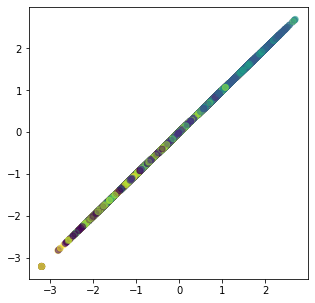

0 0


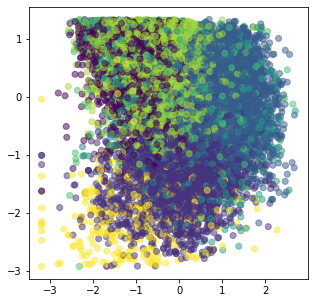

0 1


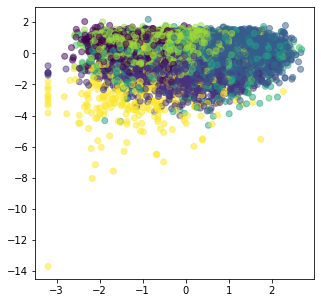

0 2


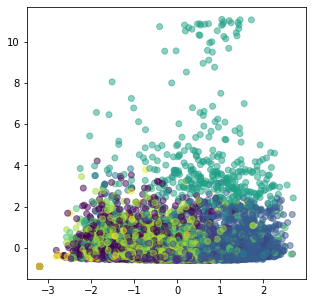

0 3


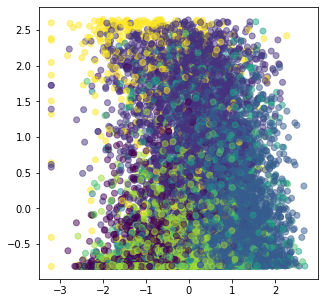

0 4


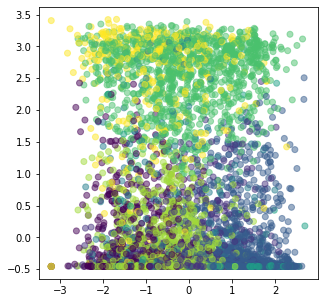

0 5


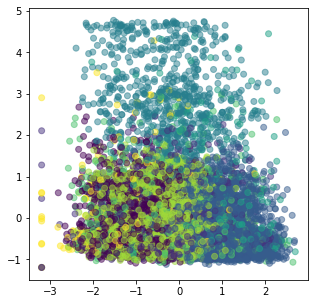

0 6


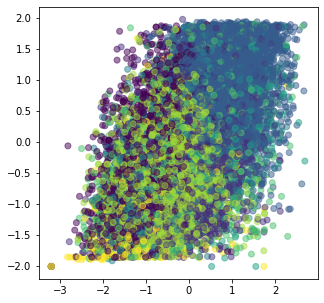

0 7


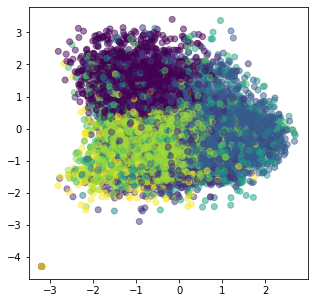

0 8


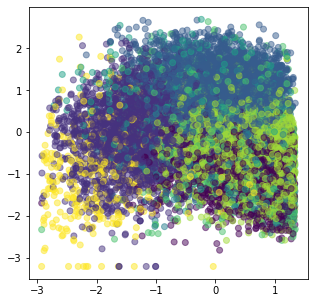

1 0


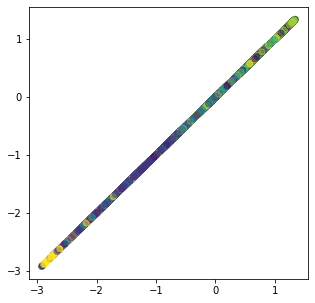

1 1


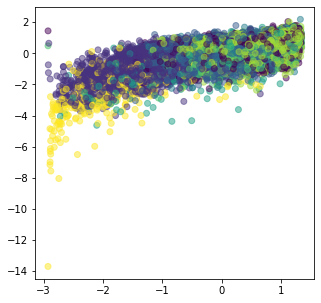

1 2


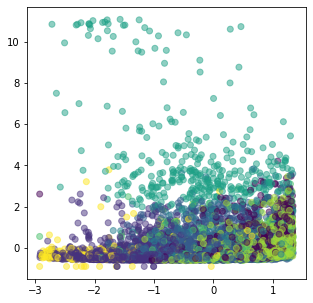

1 3


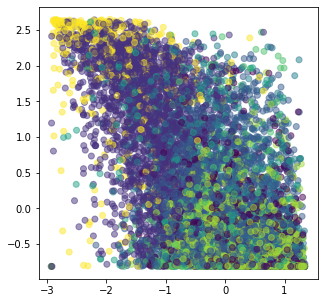

1 4


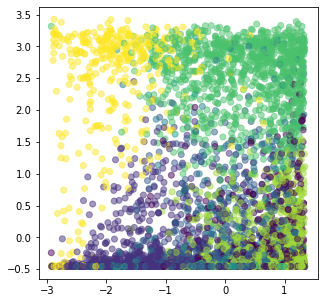

1 5


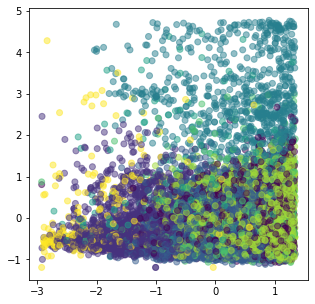

1 6


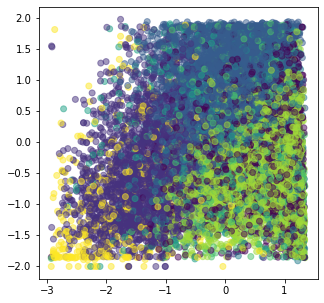

1 7


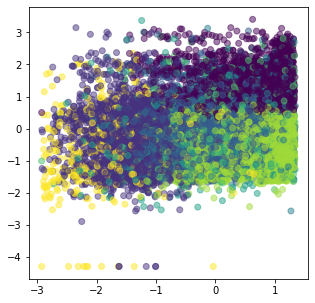

1 8


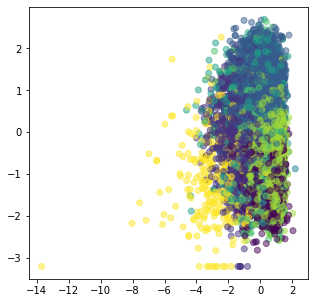

2 0


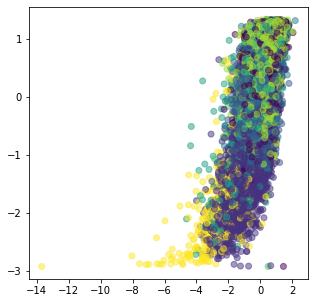

2 1


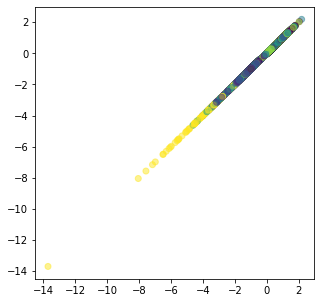

2 2


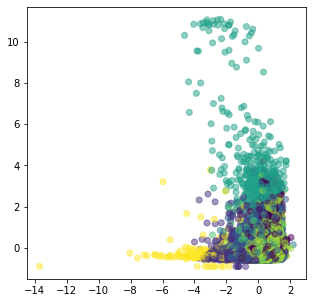

2 3


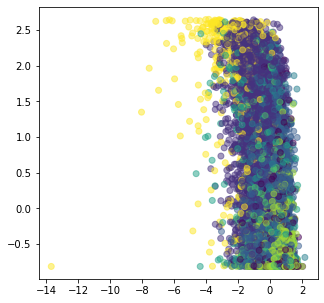

2 4


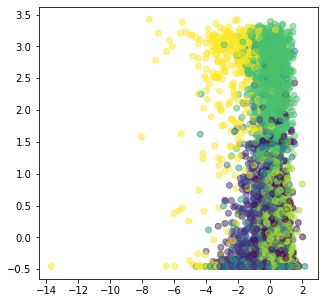

2 5


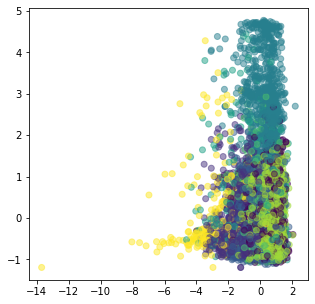

2 6


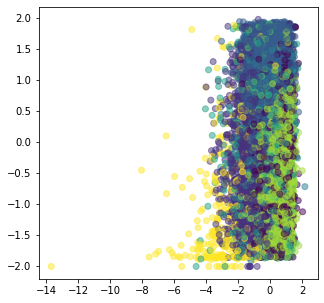

2 7


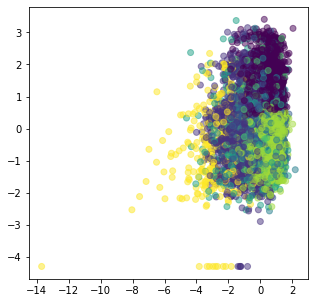

2 8


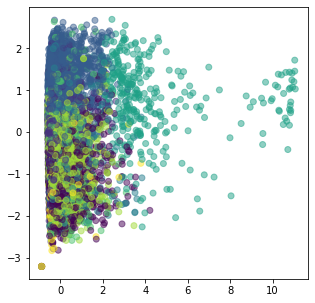

3 0


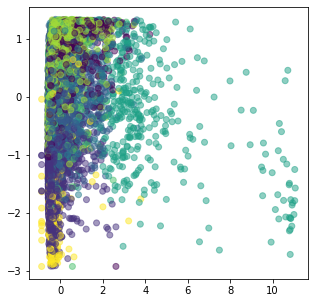

3 1


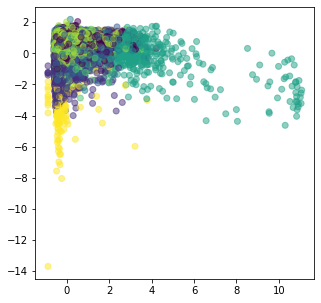

3 2


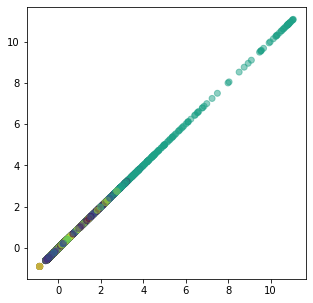

3 3


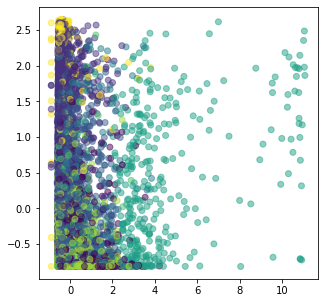

3 4


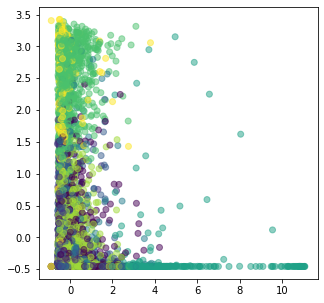

3 5


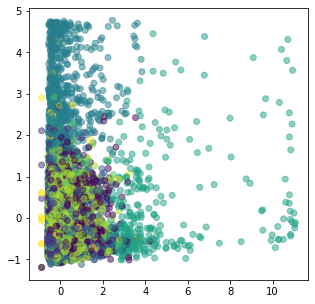

3 6


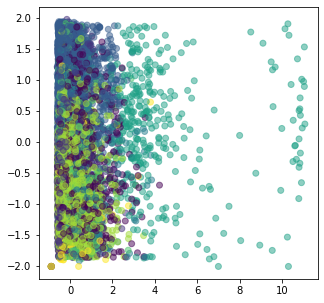

3 7


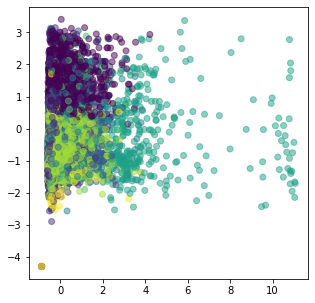

3 8


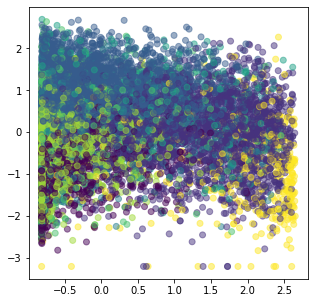

4 0


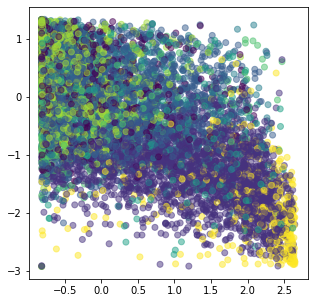

4 1


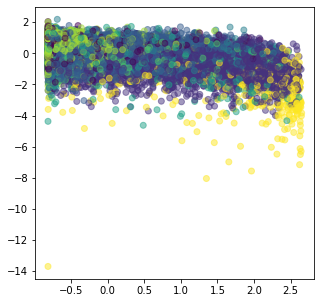

4 2


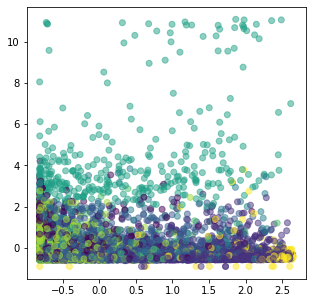

4 3


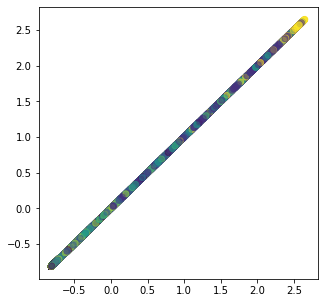

4 4


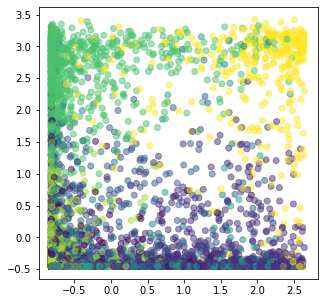

4 5


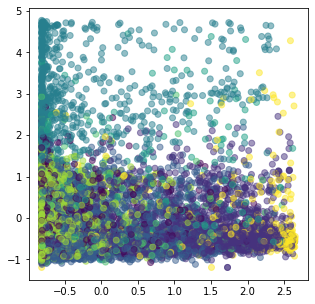

4 6


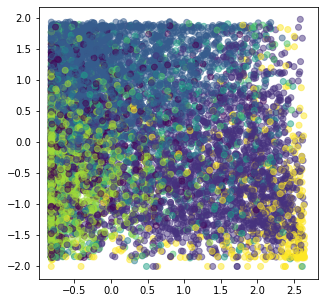

4 7


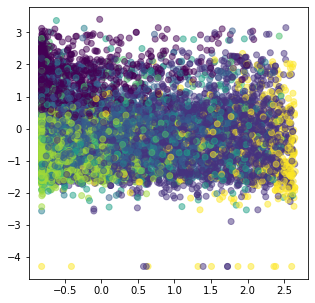

4 8


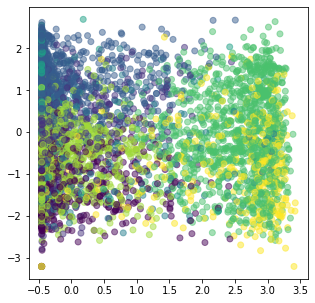

5 0


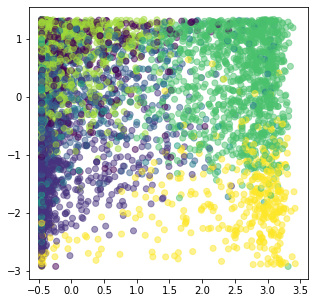

5 1


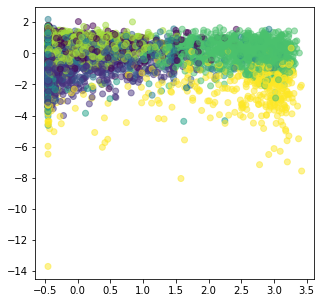

5 2


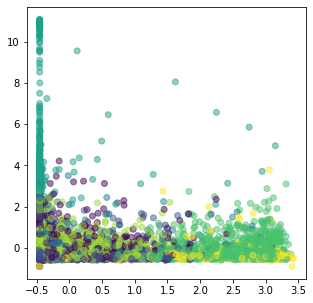

5 3


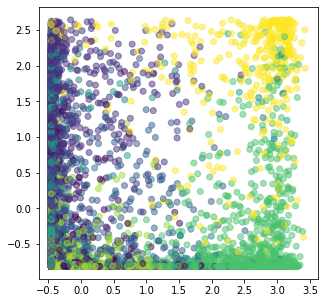

5 4


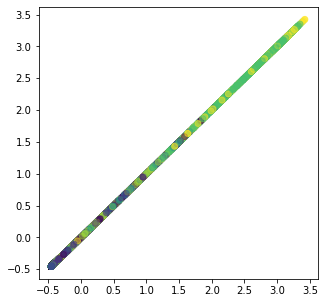

5 5


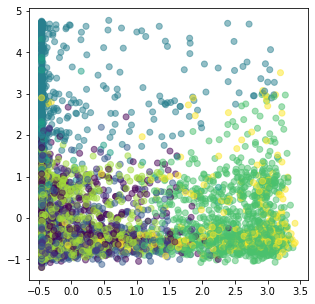

5 6


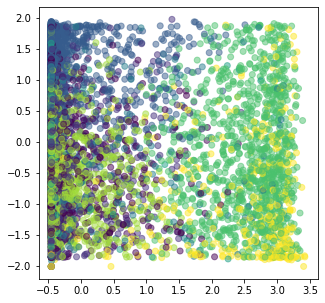

5 7


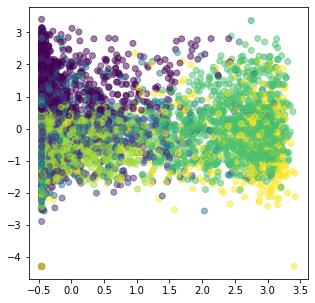

5 8


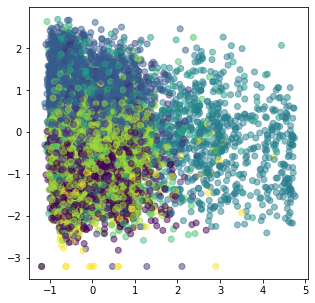

6 0


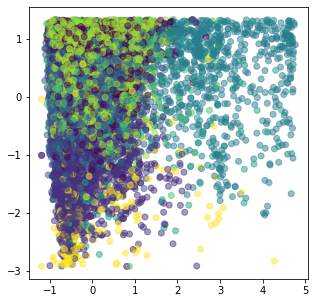

6 1


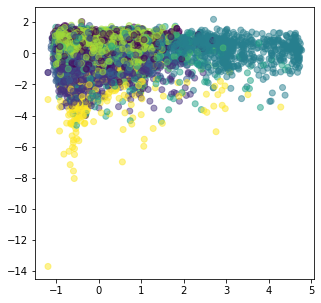

6 2


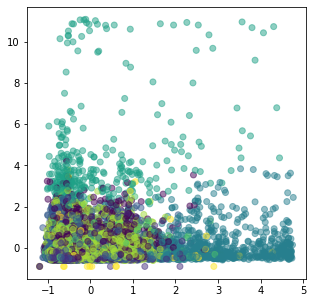

6 3


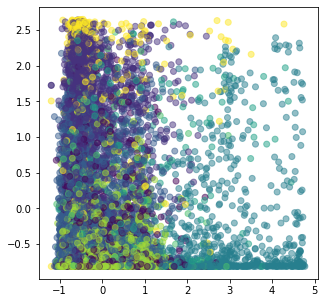

6 4


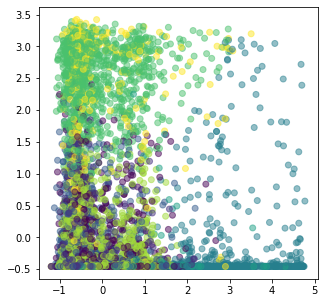

6 5


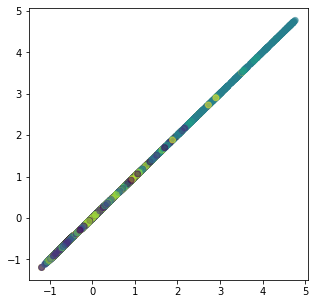

6 6


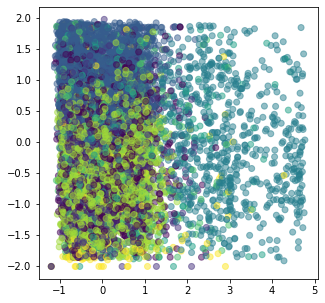

6 7


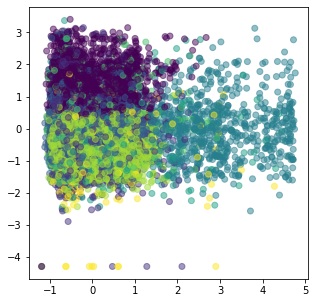

6 8


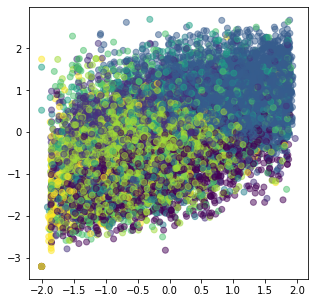

7 0


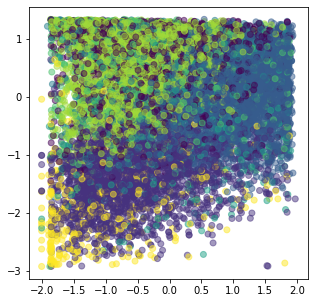

7 1


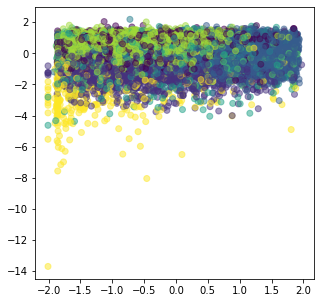

7 2


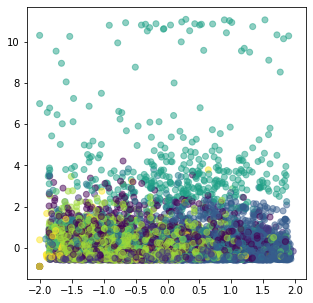

7 3


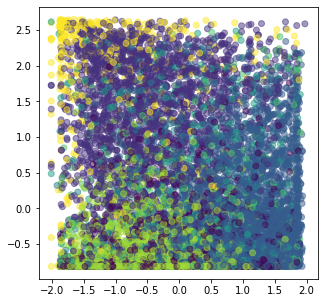

7 4


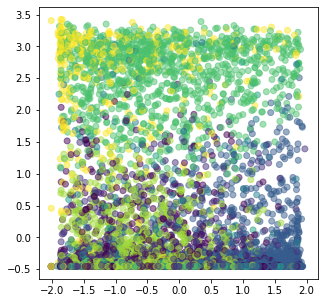

7 5


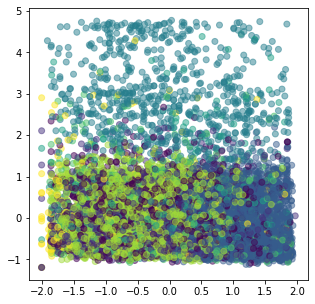

7 6


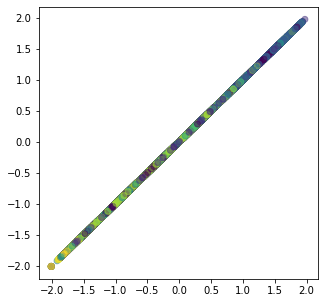

7 7


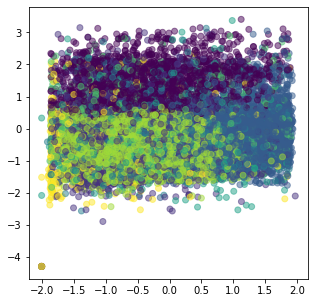

7 8


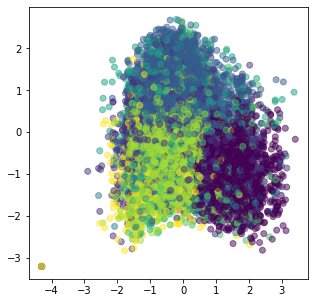

8 0


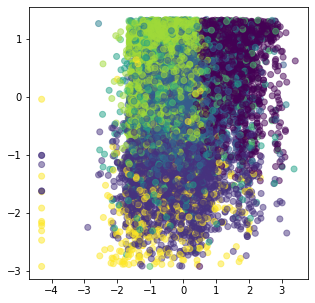

8 1


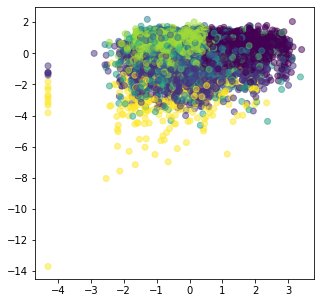

8 2


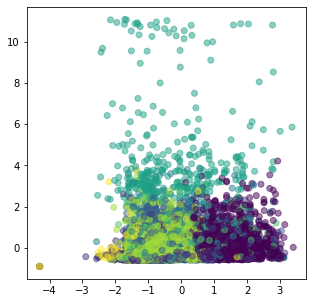

8 3


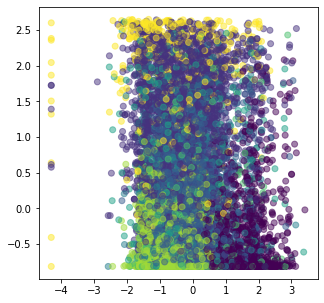

8 4


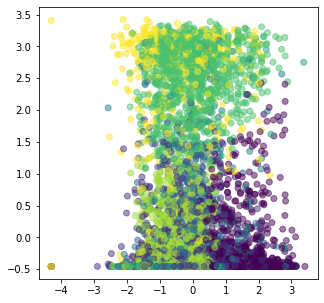

8 5


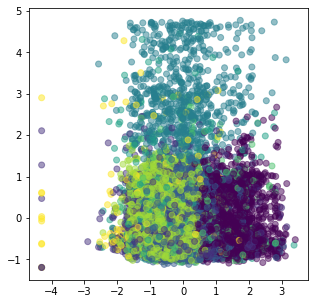

8 6


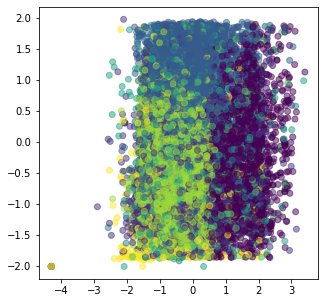

8 7


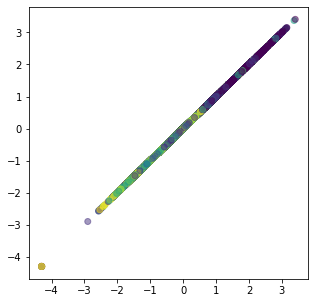

8 8


In [192]:
#loop through col names
for i in range(9):
    for j in range(9):
        plt.figure(figsize=(5, 5))
        plt.scatter(X_prep[:, i], X_prep[:, j],  c= clusters, alpha=0.5)
        plt.show()
        print(i,j)

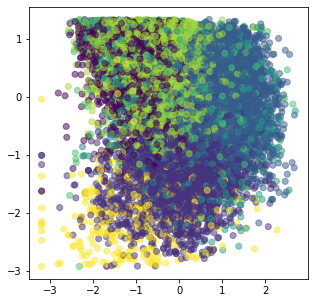

In [193]:
plt.figure(figsize=(5, 5))
plt.scatter(X_prep[:, 0], X_prep[:, 1], c=clusters,alpha=0.5)
plt.show()

It's still not very clear as to what the K number could be

**Look at the elbow Methods and Silhouette Scores to help determine the K number**

Text(0.5, 1.0, 'Elbow Method showing the optimal k')

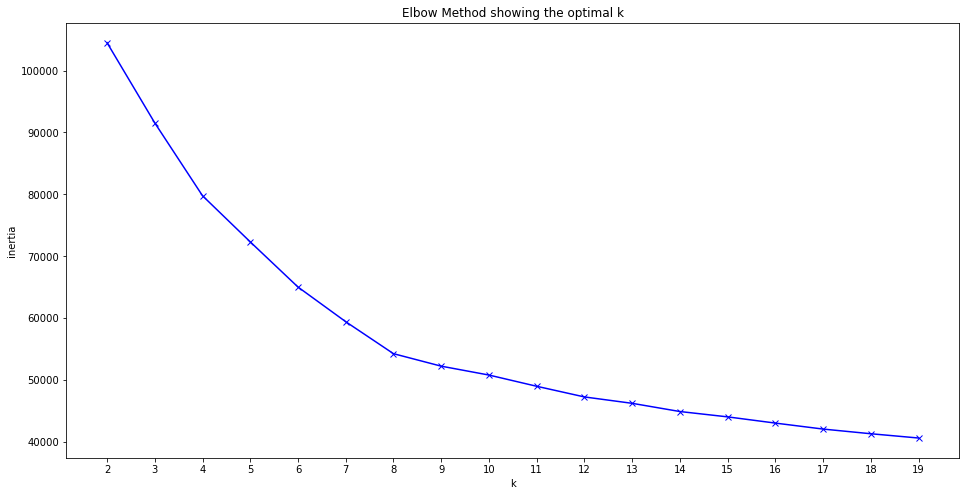

In [194]:
K = range(2, 20)
inertia = []

for k in K:
    kmeans1 = KMeans(n_clusters=k,
                    random_state=1234)
    kmeans1.fit(X_prep)
    inertia.append(kmeans1.inertia_)

    
%matplotlib inline

plt.figure(figsize=(16,8))
plt.plot(K, inertia, 'bx-')
plt.xlabel('k')
plt.ylabel('inertia')
plt.xticks(np.arange(min(K), max(K)+1, 1.0))
plt.title('Elbow Method showing the optimal k')

Text(0.5, 1.0, 'Silhouette score showing the optimal k')

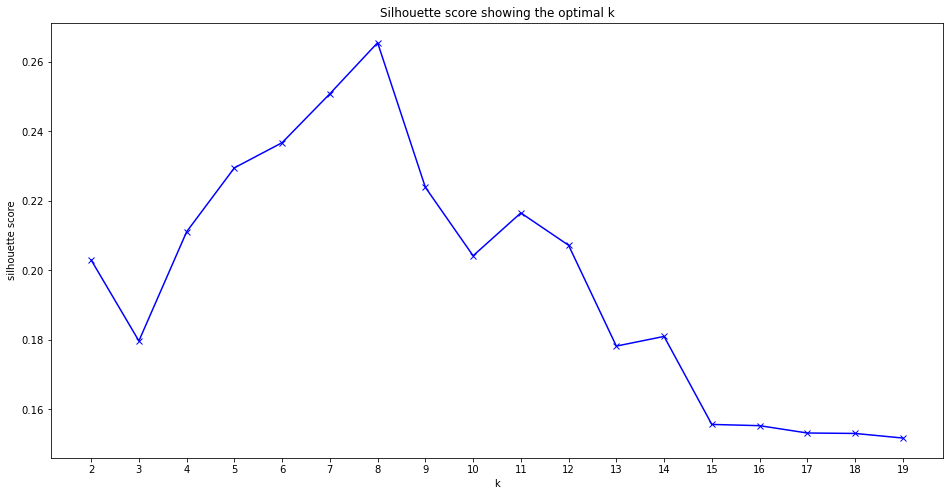

In [195]:
K = range(2, 20)
silhouette = []

for k in K:
    kmeans2 = KMeans(n_clusters=k,
                    random_state=1234)
    kmeans2.fit(X_prep)
    silhouette.append(silhouette_score(X_prep, kmeans2.predict(X_prep)))


plt.figure(figsize=(16,8))
plt.plot(K, silhouette, 'bx-')
plt.xlabel('k')
plt.ylabel('silhouette score')
plt.xticks(np.arange(min(K), max(K)+1, 1.0))
plt.title('Silhouette score showing the optimal k')

**Difficult to see clusters so we run a PCA test**

**Here we check the Component Index to see what the best K number would be**

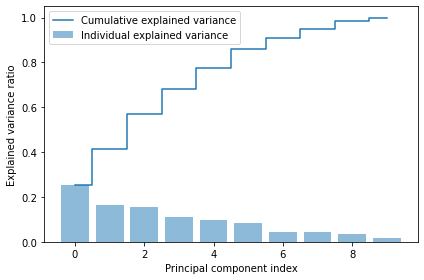

In [196]:
pca = PCA()
pca.fit(X_prep)

exp_var_pca = pca.explained_variance_ratio_
cum_sum_eigenvalues = np.cumsum(exp_var_pca)

plt.bar(range(0,len(exp_var_pca)), exp_var_pca, 
        alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, 
         where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

We decided on 8

In [197]:
pca = PCA(8)
pca.fit(X_prep)

PCA(n_components=8)

In [198]:
pca.explained_variance_ratio_.sum()

0.9501899924344247

Here we see the PCA is quite high, exactly how we want it! 

**Now we Know that 8 is the ideal K number, we can once again fit our model (this time to the correct number)**

In [199]:
kmeans = KMeans(n_clusters=8, random_state=1234)
kmeans.fit(X_prep)

KMeans(random_state=1234)

In [200]:
#We can check our cluster sizes
clusters = kmeans.predict(X_prep)
pd.Series(clusters).value_counts().sort_index()

0    1802
1    2187
2    3305
3     721
4     336
5    1075
6    2767
7     402
dtype: int64

In [201]:
y.values

array([['A Kind Of Magic - Remastered 2011', 'Queen'],
       ['Bohemian Rhapsody - Remastered 2011', 'Queen'],
       ['Another One Bites The Dust - Remastered 2011', 'Queen'],
       ...,
       ["Isn't It Midnight", 'Fleetwood Mac'],
       ['When I See You Again', 'Fleetwood Mac'],
       ['You And I, Part II', 'Fleetwood Mac']], dtype=object)

**Assign the clusters to our original, cleaned/joined dataframe**

In [202]:
final_p['cluster'] = clusters
final_p['cluster'].unique()

array([2, 1, 3, 6, 0, 5, 4, 7])

*Now we want to make sure our features in the final table are scaled*

In [203]:
final_p

,artist,song,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,cluster
0,Queen,A Kind Of Magic - Remastered 2011,0.670,0.7760,-5.874,0.0356,0.01840,0.002940,0.1280,0.703,130.128,2
1,Queen,Bohemian Rhapsody - Remastered 2011,0.414,0.4040,-9.928,0.0499,0.27100,0.000000,0.3000,0.224,71.105,1
2,Queen,Another One Bites The Dust - Remastered 2011,0.933,0.5280,-6.472,0.1610,0.11200,0.312000,0.1630,0.754,109.967,2
3,Queen,Don't Stop Me Now - Remastered 2011,0.559,0.8680,-5.276,0.1700,0.04750,0.000176,0.7760,0.609,156.295,3
4,Queen,Under Pressure - Remastered 2011,0.671,0.7120,-7.815,0.0476,0.42900,0.000000,0.1030,0.462,113.805,2
...,...,...,...,...,...,...,...,...,...,...,...,...
12590,Fleetwood Mac,Mystified,0.533,0.2510,-18.749,0.0275,0.73100,0.173000,0.0917,0.582,177.957,1
12591,Fleetwood Mac,Welcome To The Room...Sara,0.632,0.5550,-13.081,0.0409,0.11400,0.000003,0.2600,0.732,99.064,2
12592,Fleetwood Mac,Isn't It Midnight,0.469,0.7300,-11.890,0.0358,0.00264,0.048200,0.1500,0.573,145.781,0
12593,Fleetwood Mac,When I See You Again,0.544,0.0907,-20.015,0.0268,0.87200,0.000000,0.1030,0.103,79.789,1


In [204]:
final_p.to_csv('song_recommender_playlist_post-scaling.csv', index = False)

## Lab 5

In [205]:
fin = pd.read_csv('song_recommender_playlist_post-scaling.csv')

Define our song recommender


In [206]:
######Test To Work In Notebook######

def songrecommend(model):
    artist = input('Who is the artist: ')
    song = input('Give Me A Song: ')

    #come back and look through artists to loop and find all songs
    results = sp.search(q=song, type='track', limit=50)

    
    
    #print(results['tracks']['items'][0]['name'])
    counter = 0
    t = 0
    for i in results["tracks"]['items'][counter]:
        if song in list(top['track']):
            if artist in list(top['artist']):
                ron = random.randint(0,200)
                songs100 = top.iloc[ron]['track']
                artists100 = top.iloc[ron]['artist']
                print("!!HOT HOT HOT!! We Recommend you listen to",songs100,"by",artists100) 
                t += 1
                break
                
                
                
        elif artist in results["tracks"]['items'][counter]['album']['artists'][0]['name']:

            s = results["tracks"]['items'][counter]['name']
            #print(results["tracks"]['items'][counter]['name'])
            a = results["tracks"]['items'][counter]['album']['artists'][0]['name']
            #print(results["tracks"]['items'][counter]['album']['artists'][0]['name'])
            f = sp.audio_features(results["tracks"]['items'][counter]['uri'])
            uri = (results["tracks"]['items'][counter]['uri'])
            print(uri)
            
            df = pd.DataFrame({'artist': a, 'song': s, 'features': f})                 
            dffeat = pd.json_normalize(df['features'])
            #print(dffeat)
            dffeat = dffeat[['danceability','energy','loudness','speechiness','acousticness','instrumentalness','liveness','valence','tempo']] 
            #display(dffeat)
            #df = df[['artist','song']]
            #dffeat = pd.concat([df,dffeat],axis = 1)
            ## SCALE ##
            dffeatscaled = scaler.transform(dffeat)
            
            cluster = model.predict(dffeatscaled)

            print(cluster)

            songrec = final_p[final_p['cluster'] == cluster[0]]

            display(songrec)
            ran = random.randint(0,len(songrec))
            songs = songrec.iloc[ran]['song']
            artists = songrec.iloc[ran]['artist']
            print('We Recommend you listen to',songs,'by',artists)
            

            
            t += 1                  
            break
        else:
            pass

        counter += 1

    if t == 0:
        print("I'm sorry, we can't find that song")


In [207]:
songrecommend(kmeans)

Who is the artist: The Beatles
Give Me A Song: Yesterday
I'm sorry, we can't find that song


In [ ]:
X_prep[0]

In [ ]:
######Test To Work In Interface######

def songrecommend(input_artist, input_song):
    artist = input_artist.get()
    song = input_song.get()
    

    #come back and look through artists to loop and find all songs
    results = sp.search(q=song, type='track', limit=50)

    #print(results['tracks']['items'][0]['name'])
    counter = 0
    t = 0
    for i in results["tracks"]['items'][counter]:
        if song in list(top['track']):
            if artist in list(top['artist']):
                ron = random.randint(0,200)
                songs100 = top.iloc[ron]['track']
                artists100 = top.iloc[ron]['artist']
                print("!!HOT HOT HOT!! We Recommend you listen to",songs100,"by",artists100) 
                t += 1
                break
        elif artist in results["tracks"]['items'][counter]['album']['artists'][0]['name']:

            s = results["tracks"]['items'][counter]['name']
            #print(results["tracks"]['items'][counter]['name'])
            a = results["tracks"]['items'][counter]['album']['artists'][0]['name']
            #print(results["tracks"]['items'][counter]['album']['artists'][0]['name'])
            f = (sp.audio_features(results["tracks"]['items'][counter]['uri']))

            df = pd.DataFrame({'artist': a, 'song': s, 'features': f})                 
            dffeat = pd.json_normalize(df['features'])
            dffeat = dffeat[['danceability','energy','loudness','speechiness','acousticness','instrumentalness','liveness','valence','tempo']] 
            #df = df[['artist','song']]
            #dffeat = pd.concat([df,dffeat],axis = 1)

            cluster = kmeans.predict(dffeat)

            #print(cluster)

            songrec = final_p[final_p['cluster'] == cluster[0]]

            #print(songrec)
            ran = random.randint(0,len(songrec))
            songs = songrec.iloc[ran]['song']
            artists = songrec.iloc[ran]['artist']
            #print('We Recommend you listen to',songs,'by',artists)
            recommendation_song.config(text=f"{songs} by {artist}")
            

            
            t += 1                  
            break
        else:
            pass

        counter += 1

    if t == 0:
        print("I'm sorry, we can't find that song")


In [ ]:
from tkinter import *

Desing an interface to interact with the song_recommend function

In [ ]:
window = Tk()
window.title("Spotify Song Recommender")
window.minsize(width=400, height=300)
window.config(padx=90, pady=100)
#Create GUI:
input_song = Entry(width=50)
input_artist = Entry(width=50)
input_song.grid(column=1, row=0)
input_artist.grid(column=1, row=1)
artist_label = Label(text="Artist")
song_label = Label(text="Song")
artist_label.grid(column=0, row=0)
song_label.grid(column=0, row=1)
recommend_button = Button(text="Recommend", command=songrecommend(input_artist,input_song))
recommend_button.grid(column=1, row=2)
recommendation_result_song = Label()
recommendation_result_song.grid(column=1, row=3)
recommendation_result_song.config(padx=10, pady=10)
# recommendation_result_artists = Label()
# recommendation_result_artists.grid(column=1, row=4)
# recommendation_result_artists.config(padx=10, pady=10)
recommendation = Label(text="Recommended Song:")
recommendation.grid(column=0, row=3)
recommendation.config(padx=10, pady=10)
# by = Label(text="By:")
# by.grid(column=0, row=4)
# by.config(padx=10, pady=10)
window.mainloop()